In [1]:
using MIToS
using MIToS.MSA
using MIToS.Information
using StatsBase
using Plots
using LinearAlgebra
using Distances
using Clustering
using PairwiseListMatrices
using Statistics
using GraphRecipes
using DataFrames
using StatsPlots 

In [2]:
# Truncate IJulia outputs at:
ENV["LINES"]   = 20 
ENV["COLUMNS"] = 600;

In [3]:
#fasta_file = "top2a.fa"
#fasta_file = "
msa = read(fasta_file, FASTA, generatemapping=true, useidcoordinates=true)
println("This MSA has ", nsequences(msa), " sequences...")
#fig = plotmsa(msa; colorscheme = :tableau_blue_green)

This MSA has 264 sequences...


In [4]:
msa = msa[:,556:1000]

AnnotatedMultipleSequenceAlignment with 267 annotations : 264×445 Named Matrix{Residue}
                                                                                                          Seq ╲ Col │  556   557   558   559   560   561   562   563   564   565   566   567   568   569   570   571   572   573   574   575   576   577   578   579   580   581   582   583   584   585   586   587   588   589   590   591   592   593   594   595  …   961   962   963   964   965   966   967   968   969   970   971   972   973   974   975   976   977   978   979   980   981   982   983   984   985   986   987   988   989   990   991   992   993   994   995   996   997   998   999  1000
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────┼───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────

In [5]:
coverage(msa)

264×1 Named Matrix{Float64}
                                                                                                     Seq ╲ Function │ coverage
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────┼─────────
NP 001058.2 DNA topoisomerase 2-alpha Homo sapiens (1-1531)                                                         │ 0.910112
XP 005257689.1 DNA topoisomerase 2-alpha isoform X1 Homo sapiens                                                    │ 0.910112
AAA61209.1 DNA topoisomerase II (EC 5.99.1.3) Homo sapiens                                                          │ 0.910112
XP 034797810.1 DNA topoisomerase 2-alpha Pan paniscus                                                               │ 0.910112
XP 016787334.1 DNA topoisomerase 2-alpha isoform X1 Pan troglodytes                                                 │ 0.910112
CAA09762.1 DNA topoisomerase (ATP-hydrolysing) Homo sapiens                        

In [6]:
columngapfraction(msa)

1×445 Named Matrix{Float64}
Function ╲ Col │        556         557         558         559         560         561         562         563         564         565         566         567         568         569         570         571         572         573         574         575         576         577         578         579  …         977         978         979         980         981         982         983         984         985         986         987         988         989         990         991         992         993         994         995         996         997         998         999        1000
───────────────┼─────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────

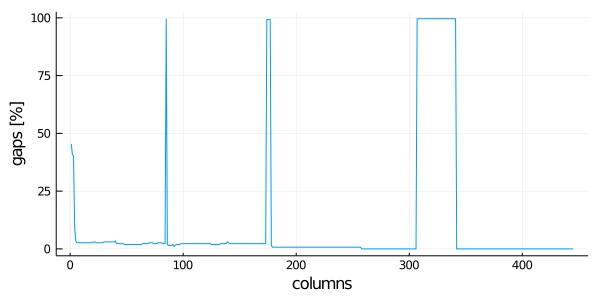

In [7]:
gr(size=(600,300))

plot(   1:ncolumns(msa), # x is a range from 1 to the number of columns
        vec(columngapfraction(msa)) .* 100.0, # y is a Vector{Float64} with the percentage of gaps of each column
        linetype = :line,
        ylabel = "gaps [%]",
        xlabel = "columns",
        legend=false)

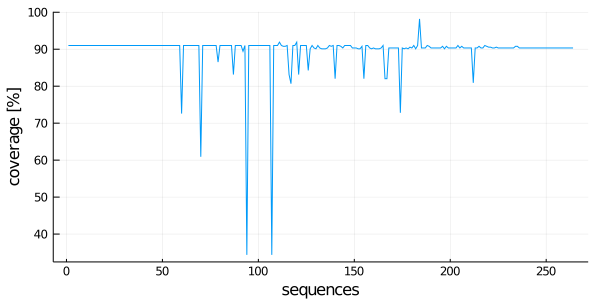

In [8]:
plot(   1:nsequences(msa), # x is a range from 1 to the number of sequences
        vec(coverage(msa)) .* 100, # y is a Vector{Float64} with the coverage of each sequence
        linetype = :line,
        ylabel = "coverage [%]",
        xlabel = "sequences",
        legend=false)

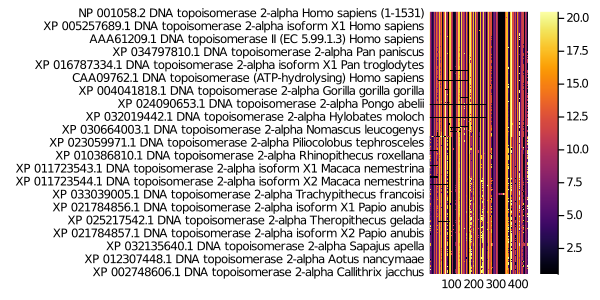

In [9]:
plot(msa)

In [10]:
println("\tsequences\tcolumns")
println( "Before:\t", nsequences(msa), "\t\t", ncolumns(msa)  )
# delete sequences with less than 90% coverage of the MSA length:
filtersequences!(msa, coverage(msa) .>= 0.9)
# delete columns with more than 10% of gaps:
filtercolumns!(msa, columngapfraction(msa) .<= 0.1)
println( "After:\t", nsequences(msa), "\t\t",  ncolumns(msa)  )

	sequences	columns
Before:	264		445
After:	247		402


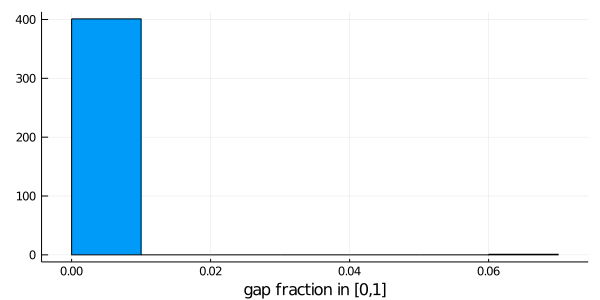

In [11]:
histogram(  vec(columngapfraction(msa)),
            # Using vec() to get a Vector{Float64} with the fraction of gaps of each column
            xlabel = "gap fraction in [0,1]", bins = 10, legend = false)

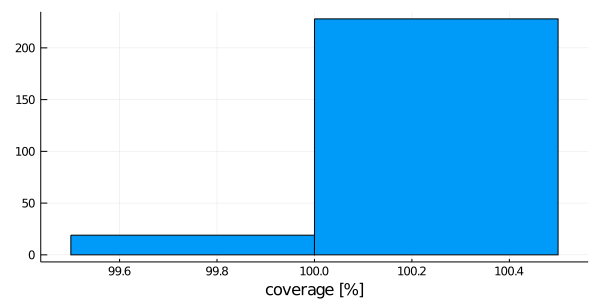

In [12]:
histogram(  vec(coverage(msa) .* 100.0), #  Column with the coverage of each sequence
            xlabel = "coverage [%]", legend=false)

In [13]:
pid = percentidentity(msa)

247×247 Named PairwiseListMatrix{Float64, false, Vector{Float64}}
                                                                                                        Seq1 ╲ Seq2 │                                                         NP 001058.2 DNA topoisomerase 2-alpha Homo sapiens (1-1531)                                                     XP 005257689.1 DNA topoisomerase 2-alpha isoform X1 Homo sapiens  …                                                     XP 035002136.1 DNA topoisomerase 2-alpha Hippoglossus stenolepis                                                       XP 023197292.1 DNA topoisomerase 2-alpha Xiphophorus maculatus
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────┼─────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────

In [14]:
pidtable = to_table(pid, diagonal=false)

30381×3 Matrix{Any}:
 "NP 001058.2 DNA topoisomerase 2-alpha Homo sapiens (1-1531)"                    "XP 005257689.1 DNA topoisomerase 2-alpha isoform X1 Homo sapiens"               100.0
 "NP 001058.2 DNA topoisomerase 2-alpha Homo sapiens (1-1531)"                    "AAA61209.1 DNA topoisomerase II (EC 5.99.1.3) Homo sapiens"                     100.0
 "NP 001058.2 DNA topoisomerase 2-alpha Homo sapiens (1-1531)"                    "XP 034797810.1 DNA topoisomerase 2-alpha Pan paniscus"                          100.0
 "NP 001058.2 DNA topoisomerase 2-alpha Homo sapiens (1-1531)"                    "XP 016787334.1 DNA topoisomerase 2-alpha isoform X1 Pan troglodytes"            100.0
 "NP 001058.2 DNA topoisomerase 2-alpha Homo sapiens (1-1531)"                    "CAA09762.1 DNA topoisomerase (ATP-hydrolysing) Homo sapiens"                     99.2537
 "NP 001058.2 DNA topoisomerase 2-alpha Homo sapiens (1-1531)"                    "XP 004041818.1 DNA topoisomerase 2-alpha Gorilla

In [15]:
quantile(convert(Vector{Float64}, pidtable[:,3]), [0.00, 0.25, 0.50, 0.75, 1.00])

5-element Vector{Float64}:
  76.61691542288557
  82.08955223880596
  85.57213930348259
  91.7910447761194
 100.0

In [16]:
meanpercentidentity(msa)

87.16362192677227

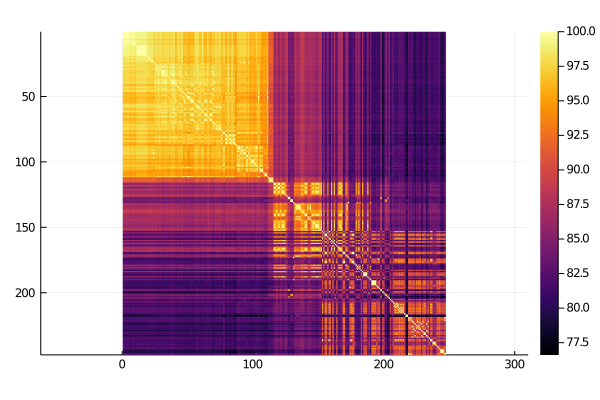

In [17]:
gr()
heatmap(convert(Matrix, pid), yflip=true, ratio=:equal)

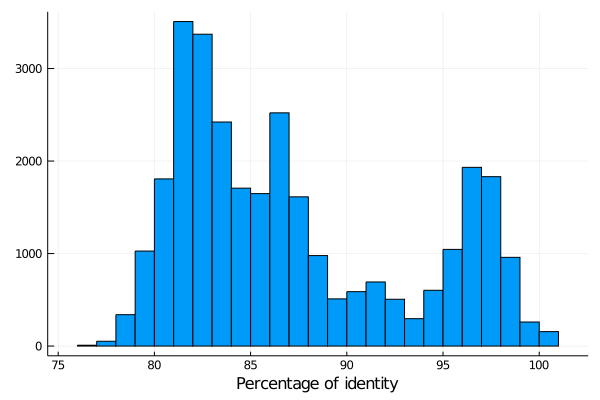

In [18]:
histogram(pidtable[:,3], xlabel ="Percentage of identity", legend=false)

In [19]:
getresidues(msa)

247×402 Matrix{Residue}:
 A  K  K  R  L  S  V  E  R  I  Y  Q  K  K  T  Q  L  E  H  I  L  L  R  P  D  T  Y  I  G  S  V  E  L  V  T  Q  Q  M  W  V  Y  D  E  D  V  G  I  N  Y  R  E  V  T  F  V  P  G  L  Y  K  I  F  D  E  I  L  V  N  A  A  D  N  K  Q  R  D  P  K  M  S  C  I  R  V  T  I  D  P  E  N  N  L  I  S  I  W  N  N  G  …  D  Y  V  A  D  Q  I  V  T  K  L  V  D  V  V  K  K  K  N  K  G  G  V  A  V  K  A  H  Q  V  K  N  H  M  W  I  F  V  N  A  L  I  E  N  P  T  F  D  S  Q  T  K  E  N  M  T  L  Q  P  K  S  F  G  S  T  C  Q  L  S  E  K  F  I  K  A  A  I  G  C  G  I  V  E  S  I  L  N  W  V  K  F  K  A  Q  V  Q  L  N  K
 A  K  K  R  L  S  V  E  R  I  Y  Q  K  K  T  Q  L  E  H  I  L  L  R  P  D  T  Y  I  G  S  V  E  L  V  T  Q  Q  M  W  V  Y  D  E  D  V  G  I  N  Y  R  E  V  T  F  V  P  G  L  Y  K  I  F  D  E  I  L  V  N  A  A  D  N  K  Q  R  D  P  K  M  S  C  I  R  V  T  I  D  P  E  N  N  L  I  S  I  W  N  N  G     D  Y  V  A  D  Q  I  V  T  K  L  V  D  V  V  K  K  K  N  K  G  G  V  A  V  K 

In [20]:
getresiduesequences(msa)

247-element Vector{Vector{Residue}}:
 [A, K, K, R, L, S, V, E, R, I  …  K, F, K, A, Q, V, Q, L, N, K]
 [A, K, K, R, L, S, V, E, R, I  …  K, F, K, A, Q, V, Q, L, N, K]
 [A, K, K, R, L, S, V, E, R, I  …  K, F, K, A, Q, V, Q, L, N, K]
 [A, K, K, R, L, S, V, E, R, I  …  K, F, K, A, Q, V, Q, L, N, K]
 [A, K, K, R, L, S, V, E, R, I  …  K, F, K, A, Q, V, Q, L, N, K]
 [A, K, K, R, L, S, V, E, R, I  …  K, F, K, A, Q, V, Q, L, N, K]
 [A, K, K, R, L, S, V, E, R, I  …  K, F, K, A, Q, V, Q, L, N, K]
 [A, K, K, R, L, S, V, E, R, I  …  K, F, K, A, Q, V, Q, L, N, K]
 ⋮
 [D, P, K, R, L, S, V, E, R, I  …  K, F, K, A, Q, T, Q, L, N, K]
 [D, P, K, R, L, S, V, E, K, I  …  K, F, K, A, Q, C, Q, L, N, K]
 [D, A, K, R, L, S, V, E, R, I  …  K, F, K, A, Q, T, Q, L, N, K]
 [D, P, K, R, M, S, V, E, R, I  …  K, F, K, A, Q, S, Q, L, N, K]
 [D, P, K, R, M, S, V, E, R, I  …  K, F, K, A, Q, S, Q, L, N, K]
 [D, P, K, R, M, S, V, E, R, I  …  K, F, K, A, Q, S, Q, L, N, K]
 [D, P, K, R, L, S, V, E, R, I  …  K, F, K, A, Q, 

In [21]:
sequencenames(msa)

247-element Vector{String}:
 "NP 001058.2 DNA topoisomerase 2-alpha Homo sapiens (1-1531)"
 "XP 005257689.1 DNA topoisomerase 2-alpha isoform X1 Homo sapiens"
 "AAA61209.1 DNA topoisomerase II (EC 5.99.1.3) Homo sapiens"
 "XP 034797810.1 DNA topoisomerase 2-alpha Pan paniscus"
 "XP 016787334.1 DNA topoisomerase 2-alpha isoform X1 Pan troglodytes"
 "CAA09762.1 DNA topoisomerase (ATP-hydrolysing) Homo sapiens"
 "XP 004041818.1 DNA topoisomerase 2-alpha Gorilla gorilla gorilla"
 "XP 024090653.1 DNA topoisomerase 2-alpha Pongo abelii"
 ⋮
 "XP 010734589.2 DNA topoisomerase 2-alpha Larimichthys crocea"
 "XP 012731584.2 DNA topoisomerase 2-alpha Fundulus heteroclitus"
 "KAF3704570.1 DNA topoisomerase 2-alpha Channa argus"
 "XP 034426494.1 DNA topoisomerase 2-alpha isoform X2 Hippoglossus hippoglossus"
 "XP 034426493.1 DNA topoisomerase 2-alpha isoform X1 Hippoglossus hippoglossus"
 "XP 035002136.1 DNA topoisomerase 2-alpha Hippoglossus stenolepis"
 "XP 023197292.1 DNA topoisomerase 2-alpha Xi

## MIToS.MSA.gapstrip

Creates a new matrix of Residues (MSA) with deleted sequences and columns/positions. The MSA is edited in the following way:

Removes all the columns/position on the MSA with gaps on the reference (first) sequence
Removes all the sequences with a coverage with respect to the number of
columns/positions on the MSA less than a coveragelimit (default to 0.75: sequences with 25% of gaps)

Removes all the columns/position on the MSA with more than a gaplimit
(default to 0.5: 50% of gaps)

In [22]:
msa1 = MIToS.MSA.gapstrip(msa,gaplimit=0.65)

AnnotatedMultipleSequenceAlignment with 252 annotations : 247×402 Named Matrix{Residue}
                                                                                                          Seq ╲ Col │  559   560   561   562   563   564   565   566   567   568   569   570   571   572   573   574   575   576   577   578   579   580   581   582   583   584   585   586   587   588   589   590   591   592   593   594   595   596   597   598  …   961   962   963   964   965   966   967   968   969   970   971   972   973   974   975   976   977   978   979   980   981   982   983   984   985   986   987   988   989   990   991   992   993   994   995   996   997   998   999  1000
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────┼───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────

In [23]:
residues = getresidues(msa1) # estimateincolumns functions take a Matrix{Residue}

247×402 Matrix{Residue}:
 A  K  K  R  L  S  V  E  R  I  Y  Q  K  K  T  Q  L  E  H  I  L  L  R  P  D  T  Y  I  G  S  V  E  L  V  T  Q  Q  M  W  V  Y  D  E  D  V  G  I  N  Y  R  E  V  T  F  V  P  G  L  Y  K  I  F  D  E  I  L  V  N  A  A  D  N  K  Q  R  D  P  K  M  S  C  I  R  V  T  I  D  P  E  N  N  L  I  S  I  W  N  N  G  …  D  Y  V  A  D  Q  I  V  T  K  L  V  D  V  V  K  K  K  N  K  G  G  V  A  V  K  A  H  Q  V  K  N  H  M  W  I  F  V  N  A  L  I  E  N  P  T  F  D  S  Q  T  K  E  N  M  T  L  Q  P  K  S  F  G  S  T  C  Q  L  S  E  K  F  I  K  A  A  I  G  C  G  I  V  E  S  I  L  N  W  V  K  F  K  A  Q  V  Q  L  N  K
 A  K  K  R  L  S  V  E  R  I  Y  Q  K  K  T  Q  L  E  H  I  L  L  R  P  D  T  Y  I  G  S  V  E  L  V  T  Q  Q  M  W  V  Y  D  E  D  V  G  I  N  Y  R  E  V  T  F  V  P  G  L  Y  K  I  F  D  E  I  L  V  N  A  A  D  N  K  Q  R  D  P  K  M  S  C  I  R  V  T  I  D  P  E  N  N  L  I  S  I  W  N  N  G     D  Y  V  A  D  Q  I  V  T  K  L  V  D  V  V  K  K  K  N  K  G  G  V  A  V  K 

## Count residues to estimate the entropy. 
The entropy estimation is performed over a rehused Counts object. The result will be a vector containing the values estimated over each column without counting gaps (UngappedAlphabet).

In [24]:

Hx = mapcolfreq!(entropy, msa, Counts(ContingencyTable(Float64, Val{1}, UngappedAlphabet())))

1×402 Named Matrix{Float64}
Function ╲ Col │       559        560        561        562        563        564        565        566        567        568        569        570        571        572        573        574        575        576        577        578        579        580        581        582        583        584  …        975        976        977        978        979        980        981        982        983        984        985        986        987        988        989        990        991        992        993        994        995        996        997        998        999       1000
───────────────┼─────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────

In [25]:
Hxy = mapcolpairfreq!(entropy, msa1, Counts(ContingencyTable(Float64, Val{2}, UngappedAlphabet())))

402×402 Named PairwiseListMatrix{Float64, true, Vector{Float64}}
Col1 ╲ Col2 │       559        560        561        562        563        564        565        566        567        568        569        570        571        572        573        574        575        576        577        578        579        580        581        582        583        584  …        975        976        977        978        979        980        981        982        983        984        985        986        987        988        989        990        991        992        993        994        995        996        997        998        999       1000
────────────┼──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────

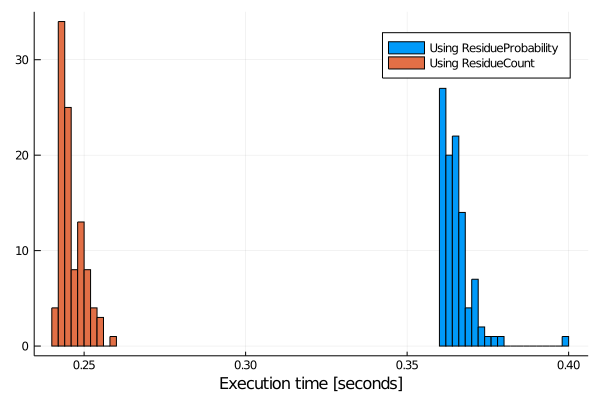

In [26]:
Time_Pab = map(1:100) do x
    time = @elapsed mapcolpairfreq!(entropy, msa, Probabilities(ContingencyTable(Float64, Val{2}, UngappedAlphabet())))
end

Time_Nab = map(1:100) do x
    time = @elapsed mapcolpairfreq!(entropy, msa, Counts(ContingencyTable(Float64, Val{2}, UngappedAlphabet())))
end

using Plots
gr()

histogram( [Time_Pab Time_Nab],
    labels = ["Using ResidueProbability" "Using ResidueCount"],
    xlabel = "Execution time [seconds]" )

In [27]:
NMIxy = mapcolpairfreq!(normalized_mutual_information, msa1, Counts(ContingencyTable(Float64, Val{2}, GappedAlphabet())), Val{false})

402×402 Named PairwiseListMatrix{Float64, false, Vector{Float64}}
Col1 ╲ Col2 │         559          560          561          562          563          564          565          566          567          568          569          570          571          572          573          574          575          576          577          578          579          580  …          979          980          981          982          983          984          985          986          987          988          989          990          991          992          993          994          995          996          997          998          999         1000
────────────┼─────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────

In [28]:
NMIxy_transpose = mapcolpairfreq!(normalized_mutual_information, transpose(msa1), Counts(ContingencyTable(Float64, Val{2}, GappedAlphabet())), Val{false})

247×247 Named PairwiseListMatrix{Float64, false, Vector{Float64}}
                                                                                                        Col1 ╲ Col2 │                                                         NP 001058.2 DNA topoisomerase 2-alpha Homo sapiens (1-1531)                                                     XP 005257689.1 DNA topoisomerase 2-alpha isoform X1 Homo sapiens  …                                                     XP 035002136.1 DNA topoisomerase 2-alpha Hippoglossus stenolepis                                                       XP 023197292.1 DNA topoisomerase 2-alpha Xiphophorus maculatus
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────┼─────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────

In [29]:
NMI_matrix_t = convert(Matrix{Float64}, NMIxy_transpose.array)

247×247 Matrix{Float64}:
 0.0       1.0       1.0       1.0       1.0       0.983117  1.0       1.0       0.984977  0.992608  0.978958  0.978958  0.978958  0.978958  0.978958  0.978958  0.978958  0.978958  0.960889  0.967905  0.947928  0.959868  0.959868  0.940706  0.943331  0.959672  0.941197  0.951976  0.959672  0.941197  …  0.639658  0.617671  0.639658  0.622288  0.613502  0.592981  0.620105  0.622288  0.620105  0.613502  0.592981  0.624818  0.631061  0.631061  0.595709  0.624818  0.642037  0.628407  0.628407  0.626096  0.628665  0.633122  0.626826  0.632956  0.641735  0.597238  0.597238  0.596868  0.638773
 1.0       0.0       1.0       1.0       1.0       0.983117  1.0       1.0       0.984977  0.992608  0.978958  0.978958  0.978958  0.978958  0.978958  0.978958  0.978958  0.978958  0.960889  0.967905  0.947928  0.959868  0.959868  0.940706  0.943331  0.959672  0.941197  0.951976  0.959672  0.941197     0.639658  0.617671  0.639658  0.622288  0.613502  0.592981  0.620105  0.622288

In [30]:
num_cluster = 5

5

In [31]:
# cluster X into 20 clusters using K-means 
KClusters = kmeans(NMI_matrix_t, num_cluster; maxiter = 100,  
                                display=:iter)

  Iters               objv        objv-change | affected 
-------------------------------------------------------------
      0       4.339933e+02
      1       2.340923e+02      -1.999011e+02 |        4
      2       2.317979e+02      -2.294328e+00 |        3
      3       2.263926e+02      -5.405345e+00 |        3
      4       2.228900e+02      -3.502578e+00 |        2
      5       2.211254e+02      -1.764590e+00 |        2
      6       2.204436e+02      -6.817777e-01 |        3
      7       2.180055e+02      -2.438158e+00 |        3
      8       2.172649e+02      -7.405756e-01 |        2
      9       2.172063e+02      -5.856568e-02 |        0
     10       2.172063e+02       0.000000e+00 |        0
K-means converged with 10 iterations (objv = 217.2063415861433)


KmeansResult{Matrix{Float64}, Float64, Int64}([0.9281404065224661 0.6565334071641835 … 0.6135022812958956 0.728391549519216; 0.9281404065224661 0.6565334071641835 … 0.6135022812958956 0.728391549519216; … ; 0.5947764412530255 0.6109876289527291 … 0.7531156486457348 0.6253277895848075; 0.6400374151615764 0.6575739629097848 … 0.7808077626176937 0.6734926766934761], [1, 1, 1, 1, 1, 1, 1, 1, 1, 1  …  3, 3, 3, 3, 3, 3, 3, 3, 3, 3], [0.9708737516895667, 0.9708737516895667, 0.9708737516895667, 0.9708737516895667, 0.9708737516895667, 0.8892909888742793, 0.9708737516895667, 0.9708737516895667, 0.8925422267265617, 0.9278774445105569  …  0.9100316770892505, 0.8927741744766138, 0.8705641670479451, 0.7183736537923835, 0.6290462663171752, 0.7482504142309665, 0.8833330622503581, 0.8833330622503581, 0.8771655362173476, 0.7704365438965226], [111, 20, 65, 1, 50], [111, 20, 65, 1, 50], 217.2063415861433, 10, true)

In [32]:
# verify the number of clusters 
nclusters(KClusters) == 5

true

In [33]:
# get the assignments of points to clusters 
cluster_assignment = assignments(KClusters) 

247-element Vector{Int64}:
 1
 1
 1
 1
 1
 1
 1
 1
 ⋮
 3
 3
 3
 3
 3
 3
 3

In [34]:
# get the cluster sizes 
cnt = counts(KClusters) 

5-element Vector{Int64}:
 111
  20
  65
   1
  50

In [35]:
# get the cluster centers 
Cluster_Center = KClusters.centers 

247×5 Matrix{Float64}:
 0.92814   0.656533  0.624427  0.613502  0.728392
 0.92814   0.656533  0.624427  0.613502  0.728392
 0.92814   0.656533  0.624427  0.613502  0.728392
 0.92814   0.656533  0.624427  0.613502  0.728392
 0.92814   0.656533  0.624427  0.613502  0.728392
 0.912834  0.648205  0.61458   0.606293  0.718107
 0.92814   0.656533  0.624427  0.613502  0.728392
 0.92814   0.656533  0.624427  0.613502  0.728392
 ⋮                                       
 0.626552  0.646927  0.783735  0.83464   0.674618
 0.633395  0.647683  0.767788  0.820703  0.657332
 0.642392  0.652103  0.790559  0.826186  0.660641
 0.594692  0.61106   0.749238  0.753874  0.625643
 0.594692  0.61106   0.749238  0.753874  0.625643
 0.594776  0.610988  0.751258  0.753116  0.625328
 0.640037  0.657574  0.778506  0.780808  0.673493

In [36]:
df = DataFrame( seqnum = 1:nsequences(msa1),
                seqname = sequencenames(msa1),
                cluster = cluster_assignment, # the cluster number/index of each sequence
                coverage = vec(coverage(msa1)))

first(df, 20)

,seqnum,seqname,cluster,coverage
,Int64,String,Int64,Float64
1,1,NP 001058.2 DNA topoisomerase 2-alpha Homo sapiens (1-1531),1,1.0
2,2,XP 005257689.1 DNA topoisomerase 2-alpha isoform X1 Homo sapiens,1,1.0
3,3,AAA61209.1 DNA topoisomerase II (EC 5.99.1.3) Homo sapiens,1,1.0
4,4,XP 034797810.1 DNA topoisomerase 2-alpha Pan paniscus,1,1.0
5,5,XP 016787334.1 DNA topoisomerase 2-alpha isoform X1 Pan troglodytes,1,1.0
6,6,CAA09762.1 DNA topoisomerase (ATP-hydrolysing) Homo sapiens,1,1.0
7,7,XP 004041818.1 DNA topoisomerase 2-alpha Gorilla gorilla gorilla,1,1.0
8,8,XP 024090653.1 DNA topoisomerase 2-alpha Pongo abelii,1,1.0
9,9,XP 032019442.1 DNA topoisomerase 2-alpha Hylobates moloch,1,1.0


In [37]:
# Group by clusters and calculate summary statistics
top_clusters = combine(
    groupby(df, :cluster),
    :seqnum => length => :n_sequences,
    :coverage => mean => :mean_coverage
)

# Display the top clusters
first(top_clusters, 20)  # Display the top 10 clusters


,cluster,n_sequences,mean_coverage
,Int64,Int64,Float64
1,1,111,0.999955
2,5,50,0.999254
3,2,20,1.0
4,3,65,0.999847
5,4,1,1.0


In [38]:
# Assuming you already have the df DataFrame with the specified columns
df_filtered = filter(row -> row.cluster > 1, df)

first(df_filtered, 20)

,seqnum,seqname,cluster,coverage
,Int64,String,Int64,Float64
1,112,XP 020853308.1 DNA topoisomerase 2-alpha Phascolarctos cinereus,5,1.0
2,113,XP 012403817.1 DNA topoisomerase 2-alpha isoform X2 Sarcophilus harrisii,5,1.0
3,114,XP 031822094.1 DNA topoisomerase 2-alpha isoform X1 Sarcophilus harrisii,5,1.0
4,115,XP 027728900.1 DNA topoisomerase 2-alpha Vombatus ursinus,5,1.0
5,116,XP 010411050.2 DNA topoisomerase 2-alpha isoform X2 Corvus cornix cornix,5,0.997512
6,117,XP 019149422.2 DNA topoisomerase 2-alpha isoform X1 Corvus cornix cornix,5,1.0
7,118,XP 021233799.1 DNA topoisomerase 2-alpha isoform X1 Numida meleagris,5,1.0
8,119,XP 031990064.1 DNA topoisomerase 2-alpha isoform X1 Corvus moneduloides,5,0.997512
9,120,XP 031990065.1 DNA topoisomerase 2-alpha isoform X2 Corvus moneduloides,5,1.0


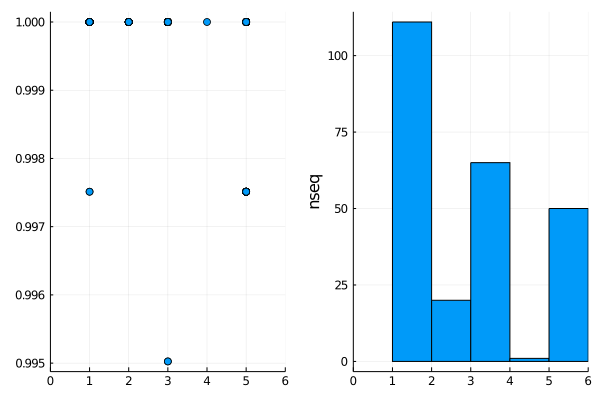

In [39]:
h = @df df histogram(:cluster, ylabel="nseq")
p = @df df plot(:cluster, :coverage, linetype=:scatter)
plot(p, h, nc=1, xlim=(0, nclusters(KClusters)+1 ), legend=false)

In [40]:
maxcoverage = by(df, :cluster, cl -> cl[ findmax(cl[:coverage])[2] ,
                 [:seqnum, :seqname, :coverage]])

first(maxcoverage, 20)

,cluster,seqnum,seqname,coverage
,Int64,Int64,String,Float64
1,1,1,NP 001058.2 DNA topoisomerase 2-alpha Homo sapiens (1-1531),1.0
2,5,112,XP 020853308.1 DNA topoisomerase 2-alpha Phascolarctos cinereus,1.0
3,2,127,XP 034271655.1 DNA topoisomerase 2-alpha isoform X1 Pantherophis guttatus,1.0
4,3,153,XP 028423903.1 DNA topoisomerase 2-alpha isoform X2 Perca flavescens,1.0
5,4,228,XP 033468100.1 DNA topoisomerase 2-alpha isoform X1 Epinephelus lanceolatus,1.0


### We use the Split-Apply-Combine strategy, though the by function of the DataFrames package, to select the sequence of highest coverage for each cluster.

In [41]:
p = @df maxcoverage plot(:cluster, :coverage, linetype=:scatter)
h = @df maxcoverage histogram(:cluster, ylabel="nseq")
plot(p, h, nc=1, xlim=(0, nclusters(KClusters)+1 ), legend=false)
png("msa_clusters_iii.png") # hide
nothing # hide

### We can easily generate a mask using list comprehension, to select only the representative sequences of the MSA (deleting the rest of the sequences with filtersequences!).

In [42]:
cluster_references = Bool[ seqnum in maxcoverage[:seqnum] for seqnum in 1:nsequences(msa1) ]

247-element Vector{Bool}:
 1
 0
 0
 0
 0
 0
 0
 0
 ⋮
 0
 0
 0
 0
 0
 0
 0

In [43]:
filtersequences!(msa1, cluster_references)

AnnotatedMultipleSequenceAlignment with 11 annotations : 5×402 Named Matrix{Residue}
                                                                  Seq ╲ Col │  559   560   561   562   563   564   565   566   567   568   569   570   571   572   573   574   575   576   577   578   579   580   581   582   583   584   585   586   587   588   589   590   591   592   593   594   595   596   597   598   599   600   601  …   958   959   960   961   962   963   964   965   966   967   968   969   970   971   972   973   974   975   976   977   978   979   980   981   982   983   984   985   986   987   988   989   990   991   992   993   994   995   996   997   998   999  1000
────────────────────────────────────────────────────────────────────────────┼──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────

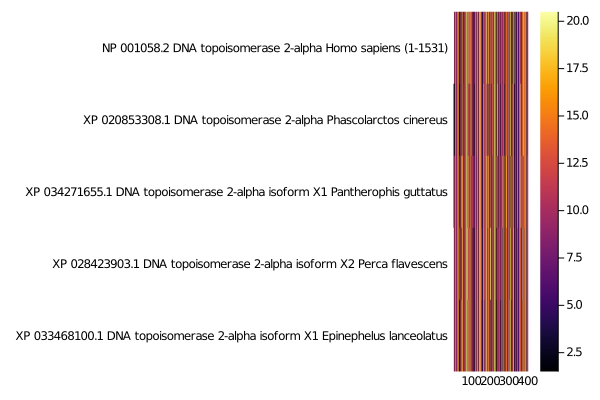

In [44]:
plot(msa1)

In [45]:
using Plots

sum(KClusters.assignments.==5)

50

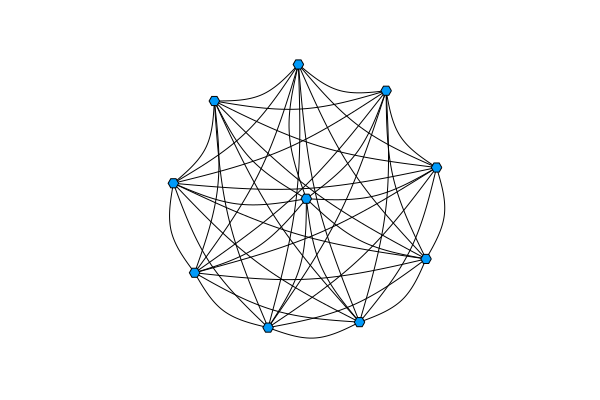

In [46]:
using GraphRecipes

graphplot(NMI_matrix_t[1:10,1:10])

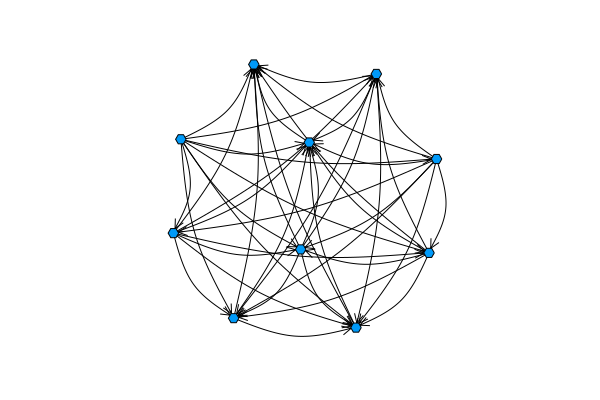

In [47]:
graphplot(UpperTriangular(NMI_matrix_t[1:10,1:10]))

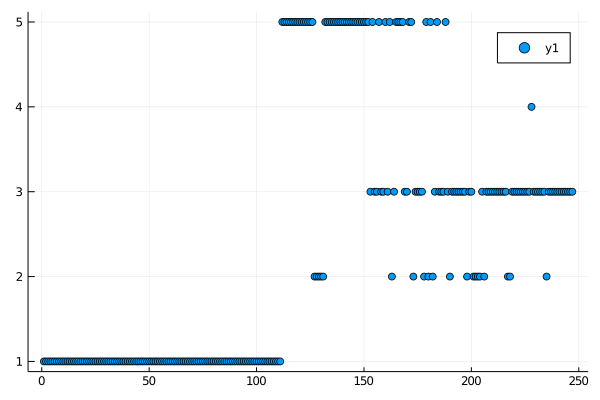

In [48]:
scatter(KClusters.assignments)

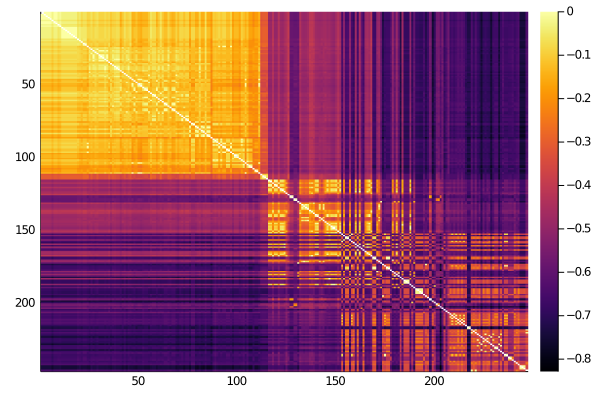

In [49]:
heatmap(log2.(NMI_matrix_t), yflip=true)

In [50]:
# Create a scatter plot
scatter(1:size(NMI_matrix_t, 2), NMI_matrix_t, color=cluster_assignment, legend=false)
xlabel!("position")
ylabel!("seq")



### Principal Component Analysis (PCA) Plot
Since the data has a high dimension, we can use PCA to reduce it to a few principal components and then plot the clusters.

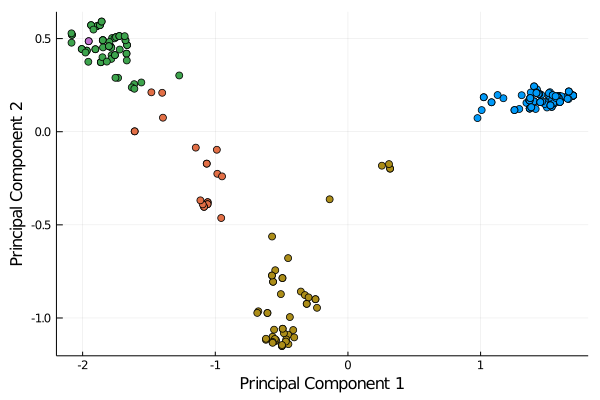

In [51]:
using MultivariateStats

# Perform PCA
pca_result = fit(PCA, NMI_matrix_t', maxoutdim=2)
pca_data = MultivariateStats.transform(pca_result, NMI_matrix_t')

# Create a PCA plot
scatter(pca_data[1, :], pca_data[2, :], color=cluster_assignment, legend=false)
xlabel!("Principal Component 1")
ylabel!("Principal Component 2")

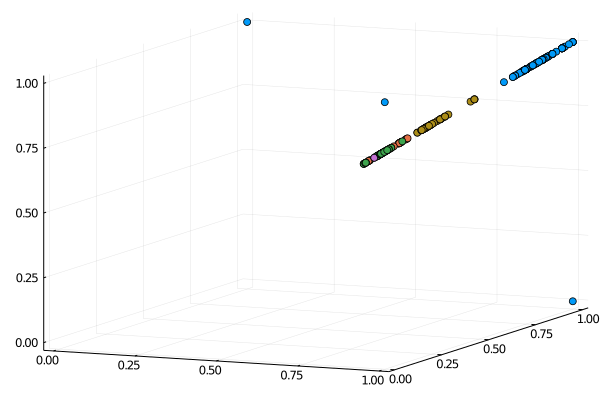

In [52]:
scatter3d(NMI_matrix_t[1, :], NMI_matrix_t[2, :], NMI_matrix_t[3, :], color=cluster_assignment, legend=false)
